# Task 4

In [1]:
!pip install tqdm
!pip install kagglehub


In [ ]:
import os
import random
from pathlib import Path
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
import kagglehub
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import KMeans, MiniBatchKMeans, AgglomerativeClustering, DBSCAN, MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
from skimage import filters, feature
from collections import defaultdict
sns.set_context("notebook")


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Part 1

In [3]:
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

SAMPLE_SIZE = 50
DOWNSCALE = 1/8

os.makedirs("./Others/T4", exist_ok=True)
BASE_DIR = Path("./Others/T4")
DATA_DIR = BASE_DIR / "data"
SAMPLED_DIR = DATA_DIR / "sampled"
os.makedirs(SAMPLED_DIR, exist_ok=True)

In [4]:
# only run when you want download dataset, we already have sampled images in this directory

print("Downloading dataset (cached if already present)...")
#ds_path = Path(kagglehub.dataset_download("ihelon/football-player-segmentation"))
ds_path = Path("/Users/amir/Desktop/Amir/UT/Term 6/Data scince/CA56/archive (1)")

print("Dataset root:", ds_path)

def discover_images_and_masks(root: Path):
    images = []
    masks = {}
    for p in root.rglob("*"):
        if p.is_file() and p.suffix.lower() in {".jpg", ".jpeg", ".png"}:
            name = p.stem.lower()

            if "mask" in name or p.parent.name.lower() == "masks":
                masks[p.stem.replace("_mask", "").lower()] = p
            elif p.parent.name.lower() == "images" or "mask" not in name:
                images.append(p)

    return images, masks

ALL_IMAGES, MASK_MAP = discover_images_and_masks(ds_path)
print(f"Found {len(ALL_IMAGES)} images, {len(MASK_MAP)} masks.")

Dataset root: /Users/amir/Desktop/Amir/UT/Term 6/Data scince/CA56/archive (1)
Found 512 images, 0 masks.


In [5]:
def prepare_sample(sample_size=SAMPLE_SIZE, scale=DOWNSCALE):
    existing = list(SAMPLED_DIR.glob("*.png"))
    if len(existing) >= sample_size:
        print("Sample already prepared.")
        return
    chosen = random.sample(ALL_IMAGES, min(sample_size, len(ALL_IMAGES)))
    for img_path in tqdm(chosen, desc="Sampling"):
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        h, w = img.shape[:2]
        img_small = cv2.resize(
            img, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)
        out_path = SAMPLED_DIR / (img_path.stem + ".png")
        cv2.imwrite(str(out_path), img_small)
       
        base_key = img_path.stem.lower()
        if base_key in MASK_MAP:
            m = cv2.imread(str(MASK_MAP[base_key]), cv2.IMREAD_GRAYSCALE)
            if m is not None:
                m_small = cv2.resize(
                    m, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_NEAREST)
                cv2.imwrite(
                    str(SAMPLED_MASK_DIR / (img_path.stem + ".png")), m_small)
    print("Sampling finished")

prepare_sample()

Sample already prepared.


## Part 2

I used three feature sets in the segmentation pipeline. The first one was just raw RGB values. This gave a simple baseline. It captures basic color differences between grass, kits, lines, and background. It is fast but often merges players with nearby regions if colors are similar, especially when jerseys are close to pitch shades or lighting changes.

The second feature set added pixel coordinates (x, y) to RGB. This helped separate regions that share colors but appear in different parts of the image. Players usually stand above the lower field band while sky and stands sit higher. Normalized positions gave a gentle spatial prior without forcing a grid pattern. It reduced some fragmented clusters compared to pure color, though it still struggled when players overlapped in crowded areas.

The third and strongest feature set combined RGB, LAB color channels, position, and texture features (LBP plus Gabor responses). LAB helped because its separation of luminance from color reduced sensitivity to shadows and glare. Texture features highlighted edges, clothing folds, and body contours that differ from the smoother grass or flat background. Local Binary Patterns captured small uniform vs non‑uniform areas while Gabor filters responded to oriented structures like limbs or jersey patterns. Together these features produced more coherent player regions and fewer false merges with the pitch.

I did not keep separate HSV, gradient magnitude, or intermediate hybrids because they added runtime without clear gains in early tests, and some redundancy appeared once LAB and texture were included. The final mixed feature set balanced detail and computation and became the default for clustering comparisons.

In [6]:
def get_sampled_images():
    return sorted(SAMPLED_DIR.glob("*.png"))

def lbp_feature(gray):
    lbp = feature.local_binary_pattern(gray, P=8, R=1, method="uniform")
    lbp = (lbp - lbp.min()) / (np.ptp(lbp) + 1e-6)
    return lbp[..., None]

def gabor_stack(gray):
    feats = []
    for theta in (0, np.pi/4, np.pi/2, 3*np.pi/4):
        real, _ = filters.gabor(gray, frequency=0.2, theta=theta)
        feats.append(real)
    arr = np.stack(feats, axis=-1)
    arr = (arr - arr.min()) / (np.ptp(arr) + 1e-6)
    return arr

def build_features(bgr, method="rgb_xy"):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    h, w = rgb.shape[:2]
    yy, xx = np.mgrid[0:h, 0:w]
    xx_n = (xx / w)[..., None]
    yy_n = (yy / h)[..., None]

    parts = []
    if method.startswith("rgb"):
        parts.append(rgb/255.0)
    if "lab" in method:
        parts.append(lab/255.0)
    if "xy" in method:
        parts.extend([xx_n, yy_n])
    if "texture" in method:
        parts.append(lbp_feature(gray))
        parts.append(gabor_stack(gray/255.0))

    feats = np.concatenate(parts, axis=-1).reshape(-1,
                                                   sum(p.shape[-1] for p in parts))
    feats = StandardScaler().fit_transform(feats)
    return feats, (h, w)

## Part 3

In [7]:
def cluster_pixels(X, method="kmeans", k=6, **kwargs):
    if method == "kmeans":
        model = KMeans(n_clusters=k, n_init='auto',
                       random_state=RANDOM_SEED, **kwargs)
        labels = model.fit_predict(X)
        extra = {"inertia": model.inertia_}
    elif method == "agglo":
        model = AgglomerativeClustering(n_clusters=k)
        labels = model.fit_predict(X)
        extra = {}
    elif method == "dbscan":
        model = DBSCAN(**kwargs)
        labels = model.fit_predict(X)
        extra = {}
        
    return labels, extra


def metrics_for(labels, X):
    valid = labels != -1
    if valid.sum() < 10 or len(np.unique(labels[valid])) < 2:
        return dict(silhouette=np.nan, db=np.nan, ch=np.nan)
    return {
        "silhouette": silhouette_score(X[valid], labels[valid]),
        "db": davies_bouldin_score(X[valid], labels[valid]),
        "ch": calinski_harabasz_score(X[valid], labels[valid])
    }


def visualize_clusters(bgr, labels, shape, title=""):
    h, w = shape
    lab_map = labels.reshape(h, w)
    uniq = np.unique(lab_map)
    rng = np.random.default_rng(0)
    color_table = rng.integers(0, 255, size=(
        uniq.max()+1 if uniq.max() >= 0 else 1, 3), dtype=np.uint8)
    seg = np.zeros((h, w, 3), dtype=np.uint8)
    for u in uniq:
        if u >= 0:
            seg[lab_map == u] = color_table[u]
    plt.figure(figsize=(9, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(seg)
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

In [ ]:
CLUSTERING_SPECS = [
    {"method": "kmeans", "ks": [4, 6, 8]},
    {"method": "agglo", "ks": [6]},
    {"method": "dbscan", "params": {"eps": 0.7, "min_samples": 50}},
]

FEATURE_METHODS = [
    "rgb",
    "rgb_xy",
    "rgb_lab_xy_texture"
]

RESULTS = []

def run_experiment(n_images=3):

    imgs = get_sampled_images()[:n_images]

    for img_path in imgs:
        bgr = cv2.imread(str(img_path))
        print(f"\nImage: {img_path.name}")

        for feat_m in FEATURE_METHODS:
            X, shape = build_features(bgr, feat_m)
            print(f" Feature {feat_m} -> {X.shape[1]} dims")

            for spec in CLUSTERING_SPECS:

                if "ks" in spec:
                    for k in spec["ks"]:

                        labels, extra = cluster_pixels(X, method=spec["method"], k=k)
                        mets = metrics_for(labels, X)

                        RESULTS.append({
                            "image": img_path.name,
                            "feature": feat_m,
                            "method": spec["method"],
                            "k": k,
                            **mets,
                            **extra
                        })

                        visualize_clusters(bgr, labels, shape, f"{spec['method']} k={k} {feat_m}")
                        
                else:

                    labels, extra = cluster_pixels(X, method=spec["method"], **spec.get("params", {}))
                    mets = metrics_for(labels, X)

                    RESULTS.append({
                        "image": img_path.name,
                        "feature": feat_m,
                        "method": spec["method"],
                        "k": np.nan,
                        **mets,
                        **extra
                    })

                    visualize_clusters(bgr, labels, shape,f"{spec['method']} {feat_m}")

    return pd.DataFrame(RESULTS)


Image: 10.png
 Feature rgb -> 3 dims


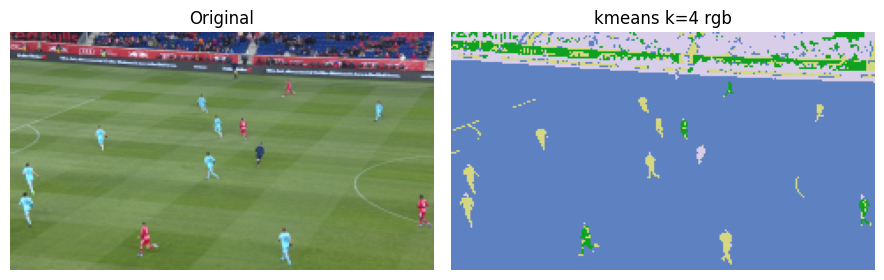

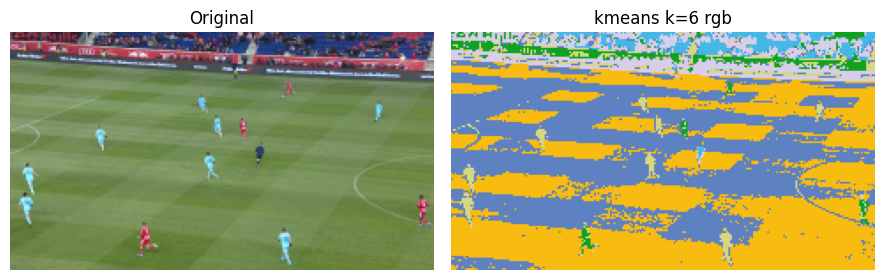

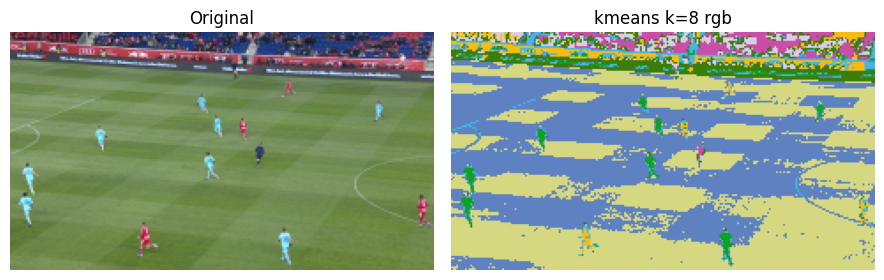

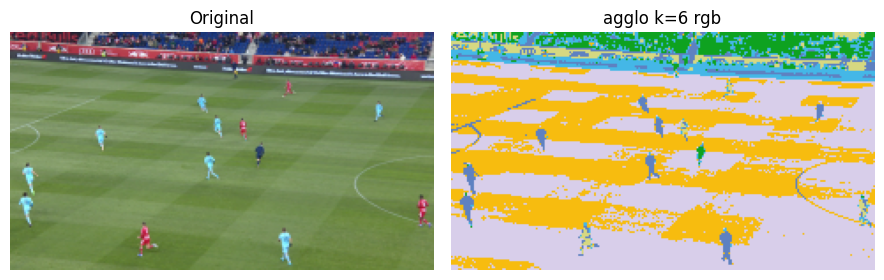

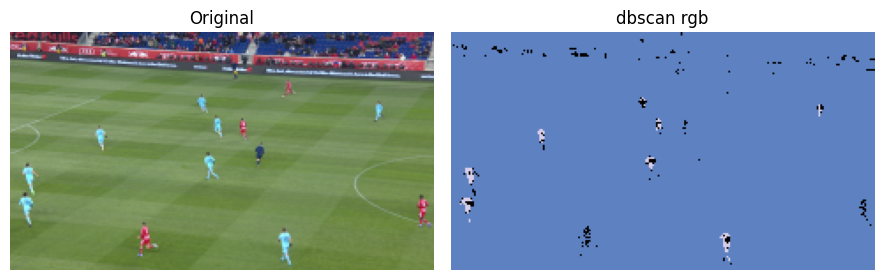

 Feature rgb_xy -> 5 dims


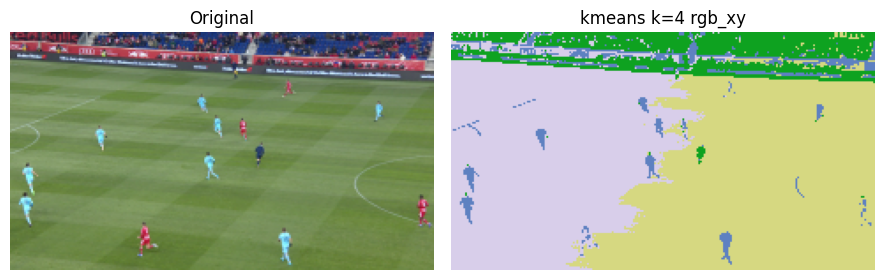

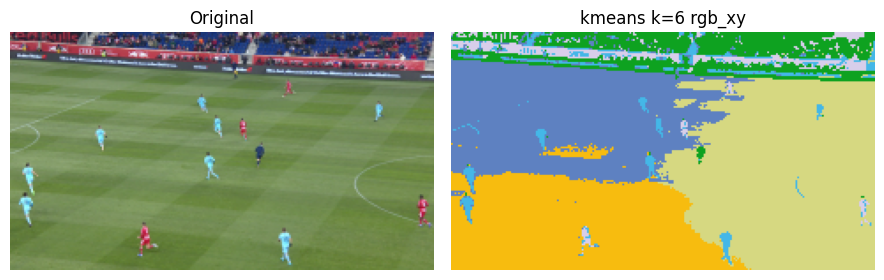

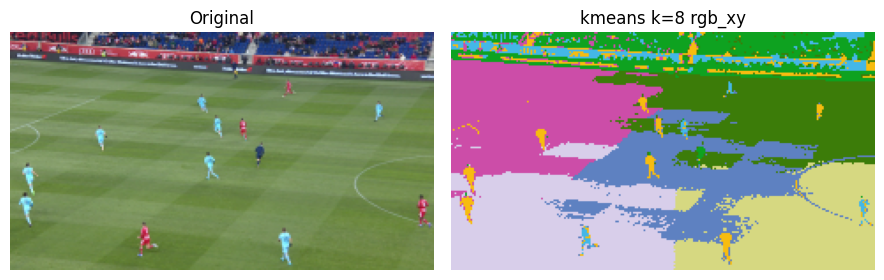

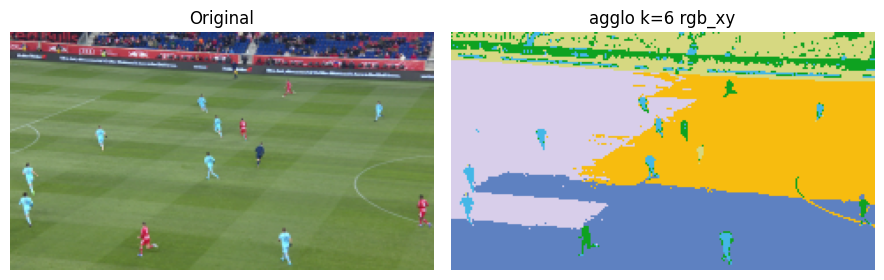

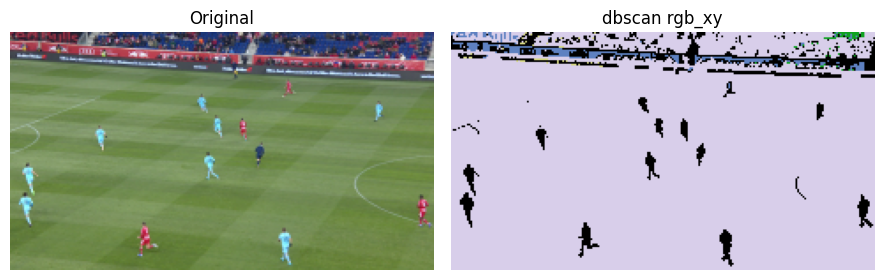

 Feature rgb_lab_xy_texture -> 13 dims


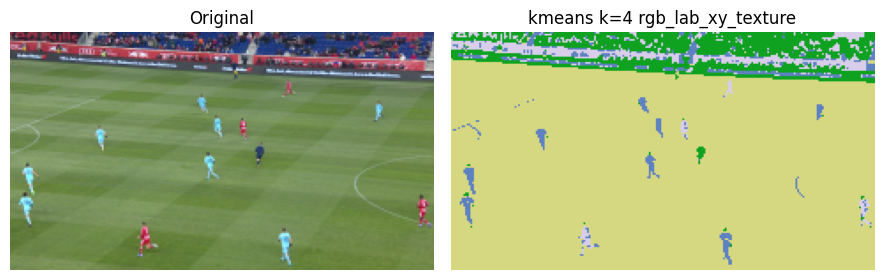

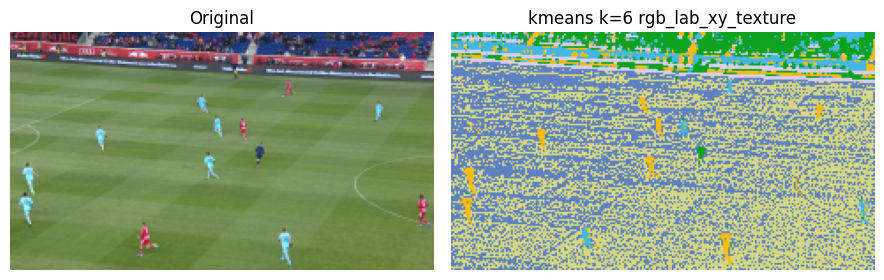

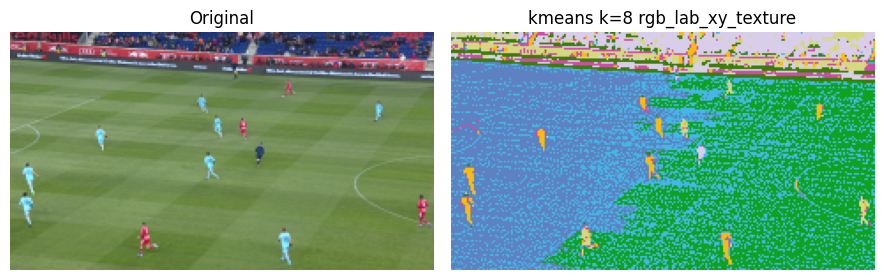

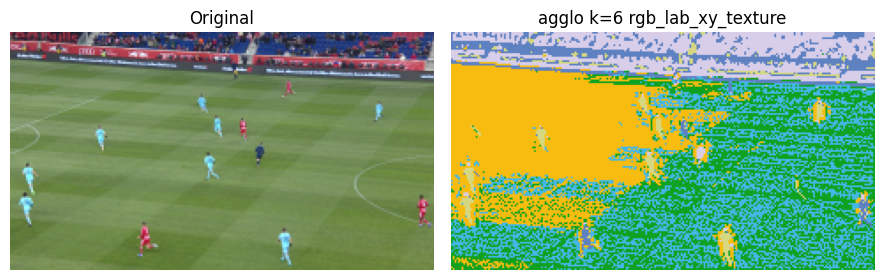

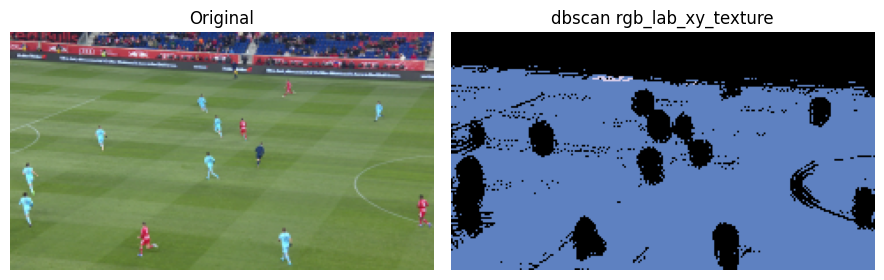

,image,feature,method,k,silhouette,db,ch,inertia
4,10.png,rgb,dbscan,NaN,0.751839,0.274191,2749.559224,NaN
0,10.png,rgb,kmeans,4.0,0.671806,0.675395,24513.392263,29724.428412
10,10.png,rgb_lab_xy_texture,kmeans,4.0,0.517610,1.524623,7787.010585,244725.997246
2,10.png,rgb,kmeans,8.0,0.474413,0.796993,27483.452956,14007.298933
1,10.png,rgb,kmeans,6.0,0.463971,0.765015,27465.032696,18552.662817
3,10.png,rgb,agglo,6.0,0.450548,0.863800,24587.625759,NaN
6,10.png,rgb_xy,kmeans,6.0,0.318430,0.980216,13871.070899,51576.039945
5,10.png,rgb_xy,kmeans,4.0,0.306066,1.117573,13398.493523,72297.363739
7,10.png,rgb_xy,kmeans,8.0,0.291938,1.010753,12790.477988,43038.842855
8,10.png,rgb_xy,agglo,6.0,0.271257,1.153547,11881.019865,NaN


In [9]:
df_results = run_experiment(n_images=1)
display(df_results.sort_values("silhouette", ascending=False).head(15))


## Part 4

In [ ]:

def relabel_sequential(lab_map):
    out = lab_map.copy()
    uniq = np.unique(out)
    pos = [u for u in uniq if u >= 0]
    remap = {u:i for i,u in enumerate(pos)}
    for u,i in remap.items():
        out[out == u] = i
    return out, remap

def compute_cluster_stats(labels, shape, bgr):
    h, w = shape
    lab_map = labels.reshape(h, w)
    stats = {}
    for u in np.unique(lab_map):
        if u < 0: 
            continue
        mask = (lab_map == u)
        area = int(mask.sum())
        if area == 0: 
            continue
        ys, xs = np.where(mask)
        y0, y1 = ys.min(), ys.max()
        x0, x1 = xs.min(), xs.max()
        mean_bgr = bgr[mask].mean(axis=0)
        stats[u] = dict(area=area, bbox=(x0,y0,x1,y1), mean_bgr=mean_bgr)
    return stats

def filter_clusters(labels, shape, bgr, min_area_frac=0.0005, max_area_frac=0.20, drop_green=True, green_ratio=1.25):
    h, w = shape
    lab_map = labels.reshape(h, w)
    total = h * w
    stats = compute_cluster_stats(labels, shape, bgr)

    keep = set()
    drop = set()

    for u, st in stats.items():
        area = st['area']
        if area < min_area_frac * total or area > max_area_frac * total:
            drop.add(u); continue
        if drop_green:
            b, g, r = st['mean_bgr']
            if g > r*green_ratio and g > b*green_ratio:
                drop.add(u); continue
        keep.add(u)

    filtered = lab_map.copy()
    for u in np.unique(lab_map):
        if u >= 0 and u in drop:
            filtered[filtered == u] = -1

    filtered, _ = relabel_sequential(filtered)
    return filtered.reshape(-1), dict(kept=len(keep), dropped=len(drop))



In [ ]:
class DSU:
    def __init__(self, n):
        self.p = list(range(n))
    def find(self, x):
        while self.p[x] != x:
            self.p[x] = self.p[self.p[x]]
            x = self.p[x]
        return x
    def union(self, a,b):
        ra, rb = self.find(a), self.find(b)
        if ra != rb: self.p[rb] = ra

def merge_adjacent_clusters(labels, shape, distance_px=4):
    h, w = shape
    lab_map = labels.reshape(h, w)
    uniq = sorted([u for u in np.unique(lab_map) if u >= 0])
    if not uniq:
        return labels, {}

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*distance_px+1, 2*distance_px+1))
    masks = {}
    dilated = {}
    for u in uniq:
        m = (lab_map == u).astype(np.uint8)
        masks[u] = m
        dilated[u] = cv2.dilate(m, kernel, iterations=1)

    idx_of = {u:i for i,u in enumerate(uniq)}
    dsu = DSU(len(uniq))

    bboxes = {}
    for u in uniq:
        ys, xs = np.where(dilated[u] > 0)
        if len(xs) == 0:
            bboxes[u] = None
        else:
            bboxes[u] = (xs.min(), ys.min(), xs.max(), ys.max())

    for i, u in enumerate(uniq):
        bx = bboxes[u]
        if bx is None: 
            continue
        x0,y0,x1,y1 = bx
        region_u = dilated[u][y0:y1+1, x0:x1+1]
        for v in uniq[i+1:]:
            bv = bboxes[v]
            if bv is None: 
                continue
            X0,Y0,X1,Y1 = bv
            if x1 < X0 or X1 < x0 or y1 < Y0 or Y1 < y0:
                continue
            xx0, yy0 = max(x0, X0), max(y0, Y0)
            xx1, yy1 = min(x1, X1), min(y1, Y1)
            ru = dilated[u][yy0:yy1+1, xx0:xx1+1]
            rv = dilated[v][yy0:yy1+1, xx0:xx1+1]
            if (ru & rv).any():
                dsu.union(idx_of[u], idx_of[v])

    groups = defaultdict(list)
    for u in uniq:
        groups[dsu.find(idx_of[u])].append(u)

    merged = np.full_like(lab_map, -1, dtype=int)
    new_id = 0
    for comp, members in groups.items():
        if len(members) == 1:
            m = (lab_map == members[0])
        else:
            m = np.zeros_like(lab_map, dtype=bool)
            for u in members:
                m |= (lab_map == u)
        merged[m] = new_id
        new_id += 1

    return merged.reshape(-1), {"n_before": len(uniq), "n_after": new_id, "groups": dict(groups)}

def step4_filter_and_merge(bgr, labels, shape, min_area_frac=0.0005, max_area_frac=0.20, drop_green=True, green_ratio=1.25, merge_distance_px=4, visualize=True, title_prefix="Step4"):

    # 1) Filter
    filt_labels, filt_info = filter_clusters(
        labels, shape, bgr,
        min_area_frac=min_area_frac,
        max_area_frac=max_area_frac,
        drop_green=drop_green, green_ratio=green_ratio
    )

    # 2) Merge
    merged_labels, merge_info = merge_adjacent_clusters(
        filt_labels, shape, distance_px=merge_distance_px
    )

    if visualize:
        h, w = shape
        def colorize(L):
            lab_map = L.reshape(h, w)
            uniq = np.unique(lab_map)
            rng = np.random.default_rng(1)
            table = rng.integers(0, 255, size=(max(uniq.max()+1,1), 3), dtype=np.uint8)
            seg = np.zeros((h,w,3), np.uint8)
            for u in uniq:
                if u >= 0:
                    seg[lab_map == u] = table[u]
            return seg
        seg_filt = colorize(filt_labels)
        seg_merge = colorize(merged_labels)

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)); plt.title("Original"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(seg_filt); plt.title(f"{title_prefix}: Filtered"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(seg_merge); plt.title(f"{title_prefix}: Merged"); plt.axis("off")
        plt.tight_layout(); plt.show()

    info = {**filt_info, **merge_info}
    return merged_labels, info


In [ ]:
def run_experiment_part4(n_images=3, visualize=True):
    """
    Part 4: Filtering & Merging over clustering outputs from Part 3.
    Returns a DataFrame of per-run results.
    """
    rows = []
    imgs = get_sampled_images()[:n_images]

    for img_path in imgs:
        bgr = cv2.imread(str(img_path))
        print(f"\n[Part4] Image: {img_path.name}")

        for feat_m in FEATURE_METHODS:
            X, shape = build_features(bgr, feat_m)
            print(f" Feature {feat_m} -> {X.shape[1]} dims")

            for spec in CLUSTERING_SPECS:
                if "ks" in spec:
                    iter_specs = [{"method": spec["method"], "k": k, "params": {}} for k in spec["ks"]]
                else:
                    iter_specs = [{"method": spec["method"], "k": np.nan, "params": spec.get("params", {})}]

                for it in iter_specs:
                    # ---- Clustering (as in Part 3) ----
                    labels, extra = cluster_pixels(
                        X,
                        method=it["method"],
                        k=int(it["k"]) if not np.isnan(it["k"]) and it["method"] != "dbscan" else 0,
                        **it["params"]
                    )
                    mets_before = metrics_for(labels, X)

                    if visualize:
                        visualize_clusters(
                            bgr, labels, shape,
                            f"{it['method']} " + (f"k={it['k']} " if not np.isnan(it["k"]) else "") + feat_m
                        )

                    # ---- Part 4: Filter & Merge ----
                    merged_labels, info = step4_filter_and_merge(
                        bgr, labels, shape,
                        min_area_frac=0.0005,
                        max_area_frac=0.20,
                        drop_green=True, green_ratio=1.25,
                        merge_distance_px=4,
                        visualize=visualize,
                        title_prefix=f"{it['method']} " + (f"k={it['k']} " if not np.isnan(it["k"]) else "") + feat_m
                    )

                    mets_after = metrics_for(merged_labels, X)

                    rows.append({
                        "image": img_path.name,
                        "feature": feat_m,
                        "method": it["method"],
                        "k": it["k"],
                        # metrics (before)
                        "silhouette_before": mets_before["silhouette"],
                        "db_before": mets_before["db"],
                        "ch_before": mets_before["ch"],
                        "inertia": extra.get("inertia", np.nan),
                        # step4 info
                        "kept": info.get("kept", np.nan),
                        "dropped": info.get("dropped", np.nan),
                        "n_before": info.get("n_before", np.nan),
                        "n_after": info.get("n_after", np.nan),
                        # metrics (after)
                        "silhouette_after": mets_after["silhouette"],
                        "db_after": mets_after["db"],
                        "ch_after": mets_after["ch"],
                    })

    df_part4 = pd.DataFrame(rows)
    return df_part4



[Part4] Image: 10.png
 Feature rgb -> 3 dims


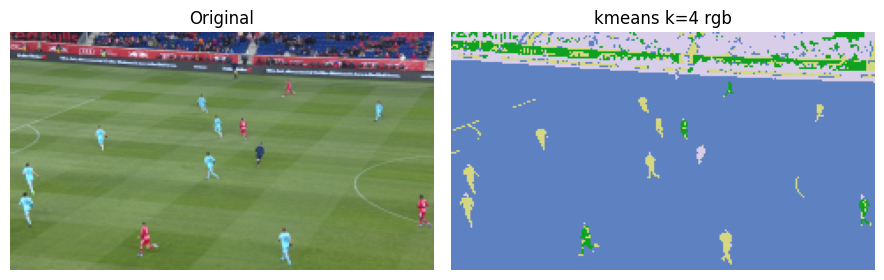

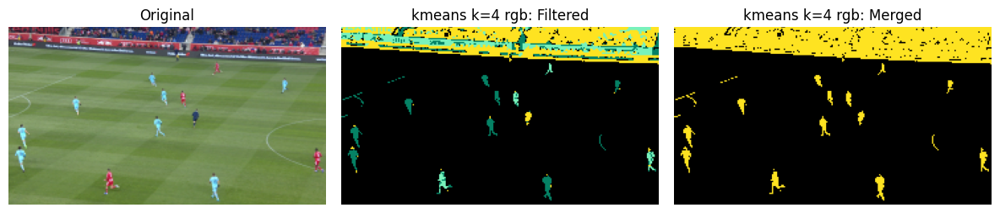

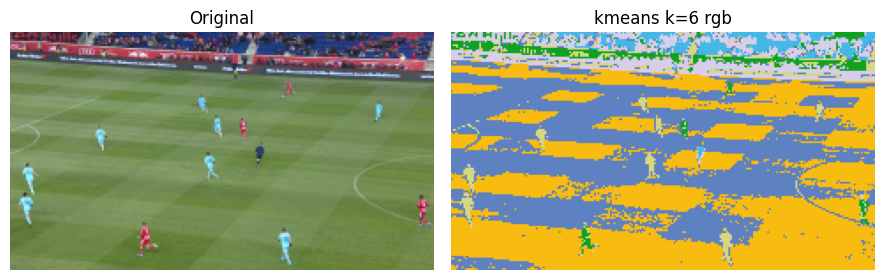

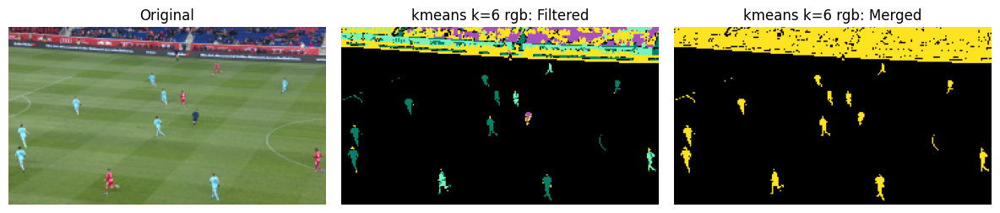

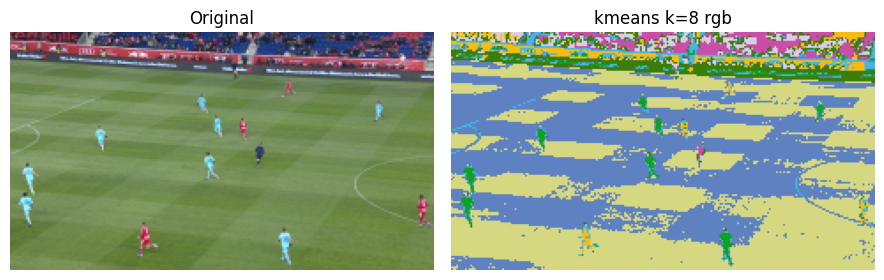

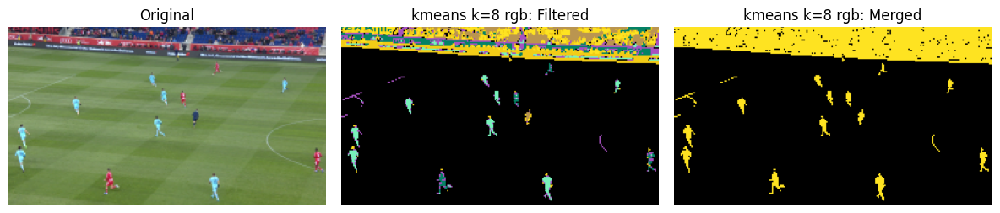

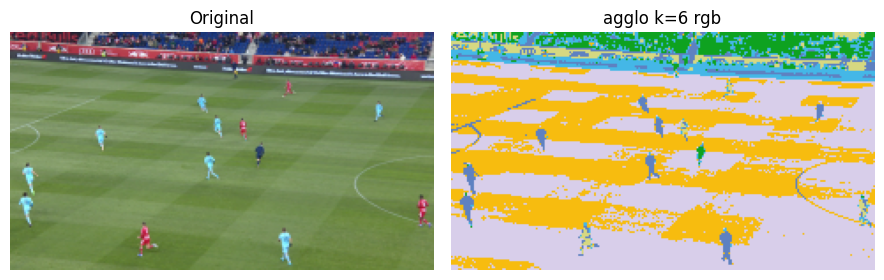

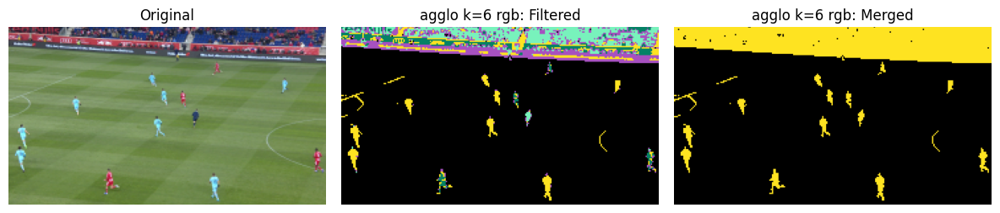

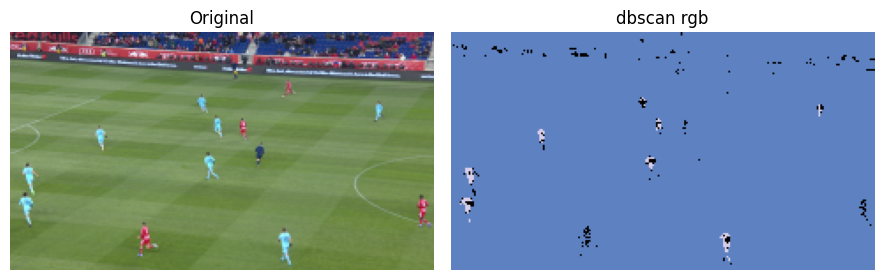

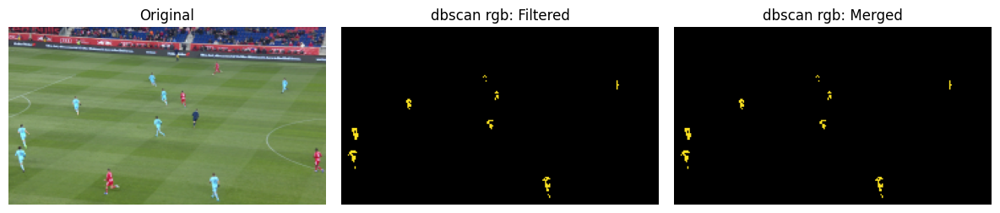

 Feature rgb_xy -> 5 dims


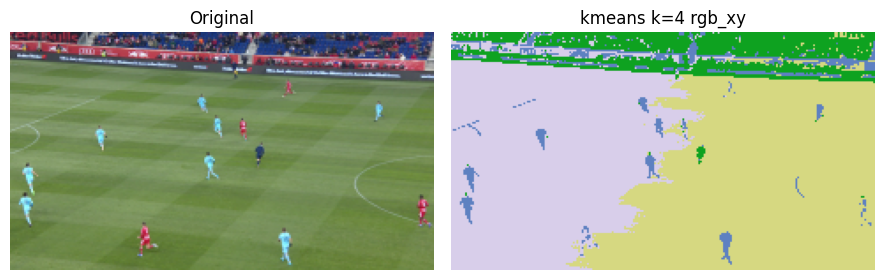

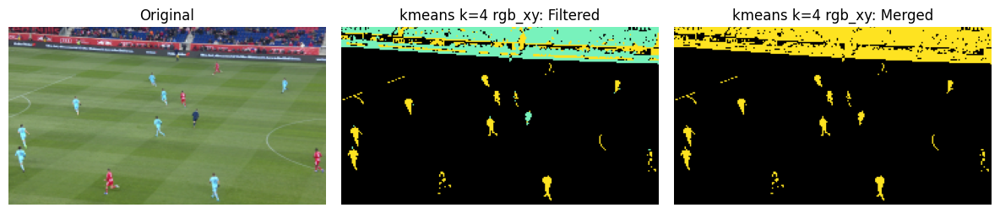

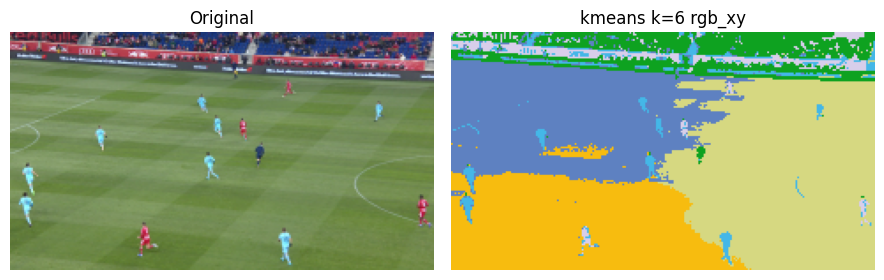

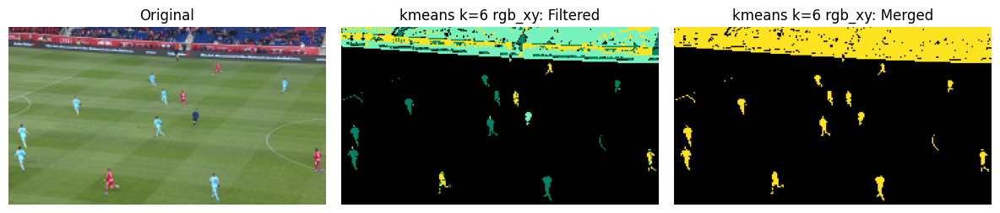

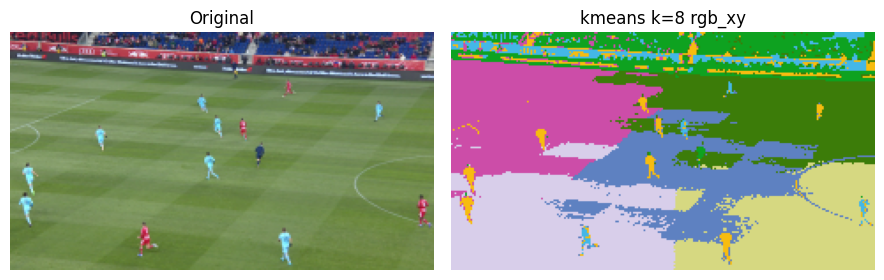

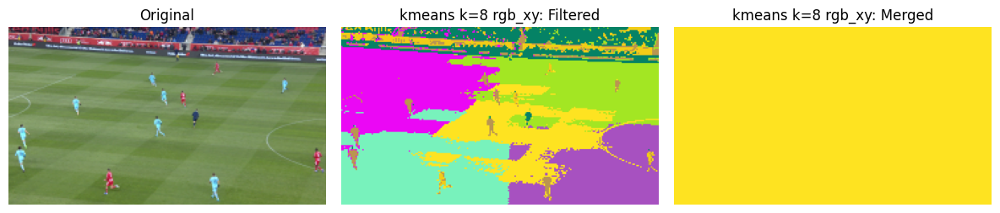

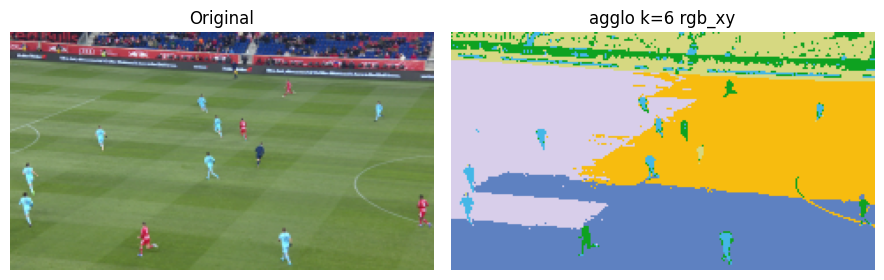

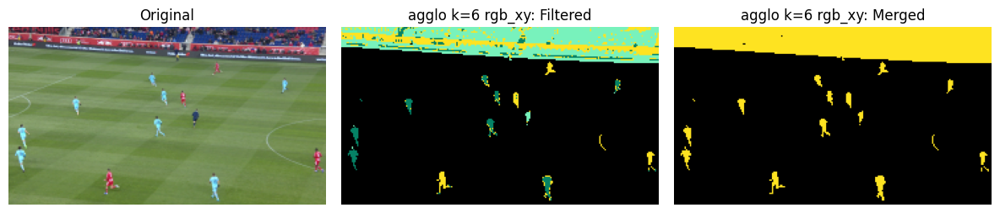

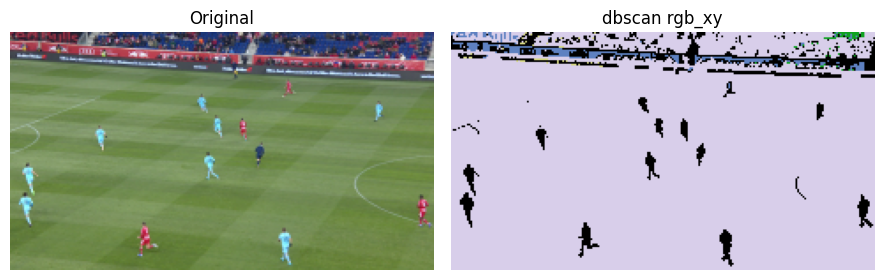

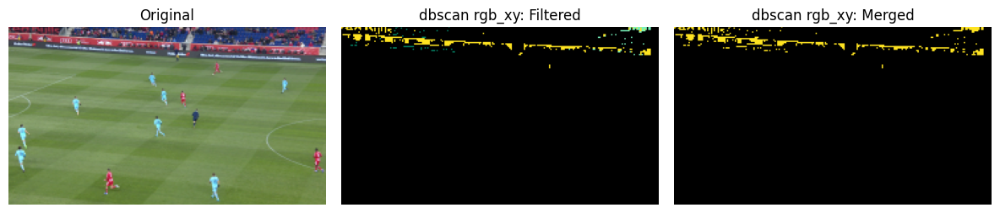

 Feature rgb_lab_xy_texture -> 13 dims


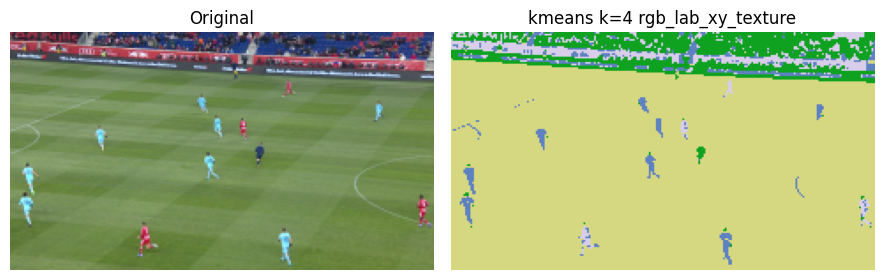

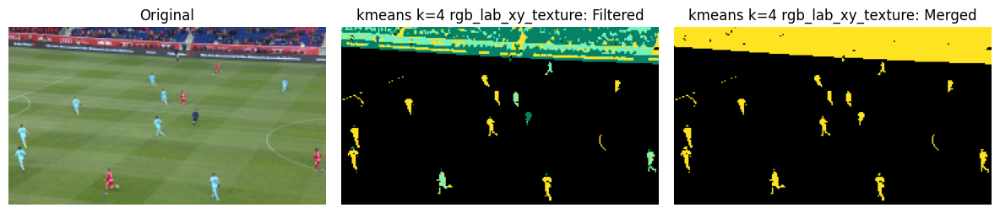

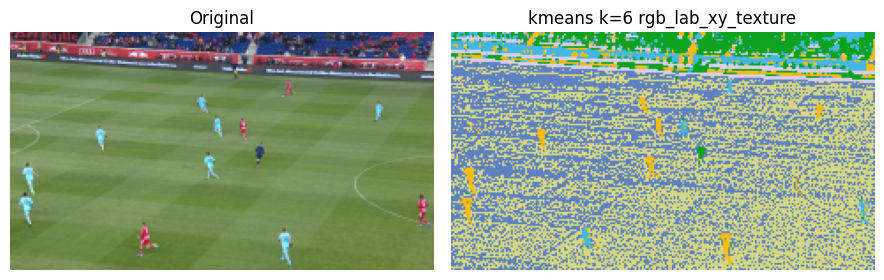

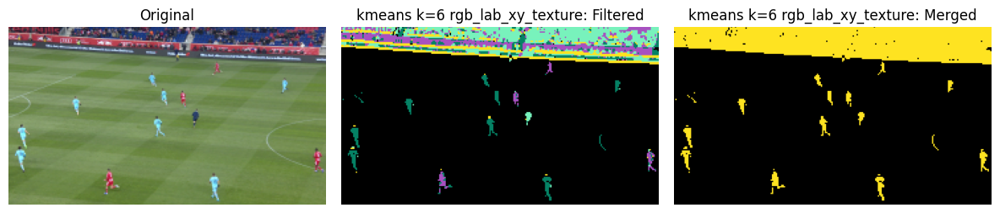

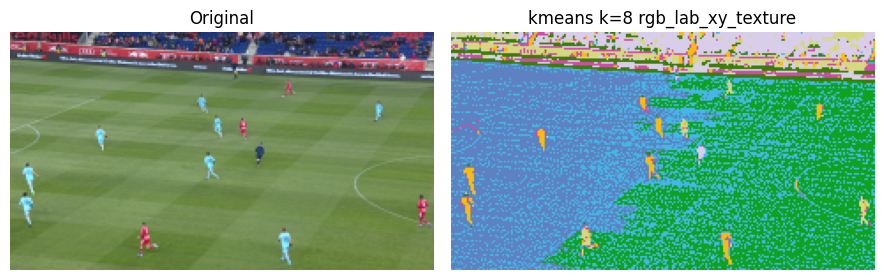

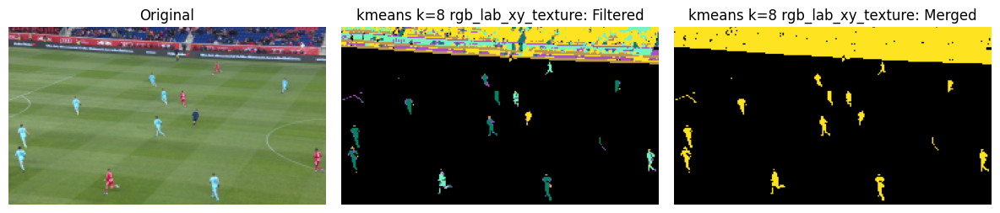

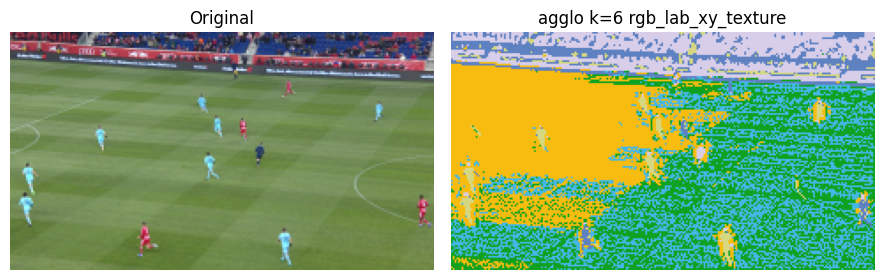

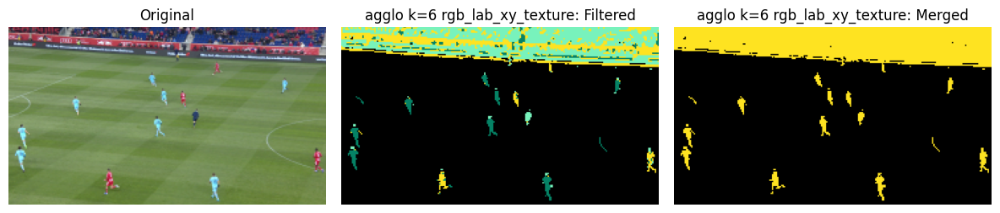

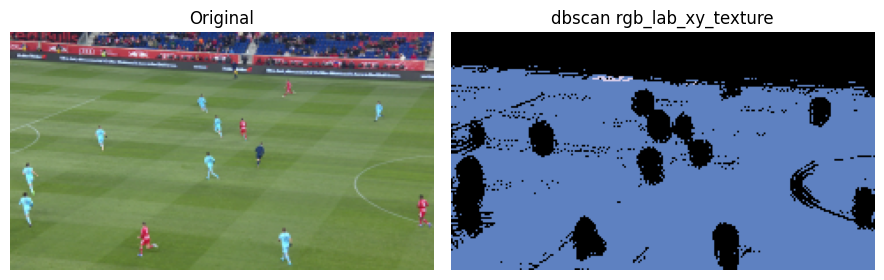

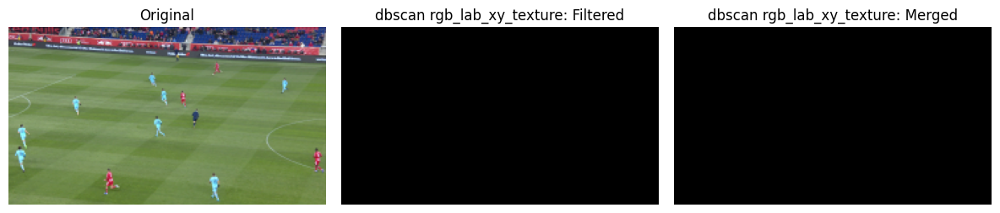

,image,feature,method,k,silhouette_before,db_before,ch_before,inertia,kept,dropped,n_before,n_after,silhouette_after,db_after,ch_after
0,10.png,rgb,kmeans,4.0,0.671806,0.675395,24513.392263,29724.428412,3,1,3.0,1.0,NaN,NaN,NaN
1,10.png,rgb,kmeans,6.0,0.463971,0.765015,27465.032696,18552.662817,4,2,4.0,1.0,NaN,NaN,NaN
2,10.png,rgb,kmeans,8.0,0.474413,0.796993,27483.452956,14007.298933,6,2,6.0,1.0,NaN,NaN,NaN
3,10.png,rgb,agglo,6.0,0.450548,0.863800,24587.625759,NaN,4,2,4.0,1.0,NaN,NaN,NaN
4,10.png,rgb,dbscan,NaN,0.751839,0.274191,2749.559224,NaN,1,1,1.0,1.0,NaN,NaN,NaN
5,10.png,rgb_xy,kmeans,4.0,0.306066,1.117573,13398.493523,72297.363739,2,2,2.0,1.0,NaN,NaN,NaN
6,10.png,rgb_xy,kmeans,6.0,0.318430,0.980216,13871.070899,51576.039945,3,3,3.0,1.0,NaN,NaN,NaN
7,10.png,rgb_xy,kmeans,8.0,0.291938,1.010753,12790.477988,43038.842855,8,0,8.0,1.0,NaN,NaN,NaN
8,10.png,rgb_xy,agglo,6.0,0.271257,1.153547,11881.019865,NaN,3,3,3.0,1.0,NaN,NaN,NaN
9,10.png,rgb_xy,dbscan,NaN,0.243365,0.857279,741.857431,NaN,3,1,3.0,1.0,NaN,NaN,NaN


In [16]:
df_part4 = run_experiment_part4(n_images=1, visualize=True)
display(df_part4.sort_values(["silhouette_after"], ascending=False).head(15))


## Part 5

In [ ]:
def make_binary_mask_from_labels(merged_labels, shape, morph_close_radius=3, morph_open_radius=2, min_component_area_frac=0.0005):

    h, w = shape
    lab_map = merged_labels.reshape(h, w)
    mask = (lab_map >= 0).astype(np.uint8)

    if morph_close_radius > 0:
        k_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,
                                            (2*morph_close_radius+1, 2*morph_close_radius+1))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k_close, iterations=1)

    if morph_open_radius > 0:
        k_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,
                                           (2*morph_open_radius+1, 2*morph_open_radius+1))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k_open, iterations=1)

    num_labels, comp_map, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
    total = h * w
    min_area = int(min_component_area_frac * total)

    cleaned = np.zeros_like(mask)
    for cid in range(1, num_labels):
        area = stats[cid, cv2.CC_STAT_AREA]
        if area >= min_area:
            cleaned[comp_map == cid] = 1

    return cleaned


In [ ]:
def components_and_centroids(mask, image_name=""):
  
    num_labels, comp_map, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)

    rows = []
    for cid in range(1, num_labels):
        x, y, w, h, area = stats[cid]
        cx, cy = centroids[cid]
        rows.append({
            "image": image_name,
            "label": cid,
            "area": int(area),
            "bbox_x": int(x), "bbox_y": int(y),
            "bbox_w": int(w), "bbox_h": int(h),
            "centroid_x": float(cx), "centroid_y": float(cy)
        })
    df = pd.DataFrame(rows)
    return comp_map, df


In [ ]:
def visualize_mask_and_components(bgr, mask, comp_df, title="Binary Mask + Centroids"):
    h, w = mask.shape
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    overlay = rgb.copy()

    for _, r in comp_df.iterrows():
        x, y, bw, bh = int(r["bbox_x"]), int(r["bbox_y"]), int(r["bbox_w"]), int(r["bbox_h"])
        cx, cy = int(r["centroid_x"]), int(r["centroid_y"])
        cv2.rectangle(overlay, (x, y), (x+bw, y+bh), (255, 0, 0), 2)
        cv2.circle(overlay, (cx, cy), 4, (0, 255, 0), -1)

    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1); plt.imshow(rgb); plt.title("Original"); plt.axis("off")
    plt.subplot(1,3,2); plt.imshow(mask, cmap="gray"); plt.title("Binary Mask"); plt.axis("off")
    plt.subplot(1,3,3); plt.imshow(overlay); plt.title(title); plt.axis("off")
    plt.tight_layout(); plt.show()


In [ ]:
def run_experiment_part5(n_images=1, visualize=True, min_area_frac_step4=0.0005, max_area_frac_step4=0.20, green_filter_step4=True, green_ratio_step4=1.25, merge_distance_px=4, morph_close_radius=3, morph_open_radius=2, min_component_area_frac=0.0005):
    comp_rows = []
    imgs = get_sampled_images()[:n_images]
    for img_path in imgs:
        bgr = cv2.imread(str(img_path))
        print(f"\n[Part5] Image: {img_path.name}")

        for feat_m in FEATURE_METHODS:
            X, shape = build_features(bgr, feat_m)
            print(f" Feature {feat_m} -> {X.shape[1]} dims")

            for spec in CLUSTERING_SPECS:
                if "ks" in spec:
                    iter_specs = [{"method": spec["method"], "k": k, "params": {}} for k in spec["ks"]]
                else:
                    iter_specs = [{"method": spec["method"], "k": np.nan, "params": spec.get("params", {})}]

                for it in iter_specs:
                    labels, _ = cluster_pixels(
                        X,
                        method=it["method"],
                        k=int(it["k"]) if not np.isnan(it["k"]) and it["method"] != "dbscan" else 0,
                        **it["params"]
                    )

                    # Step4: Filter & Merge
                    merged_labels, info4 = step4_filter_and_merge(
                        bgr, labels, shape,
                        min_area_frac=min_area_frac_step4,
                        max_area_frac=max_area_frac_step4,
                        drop_green=green_filter_step4, green_ratio=green_ratio_step4,
                        merge_distance_px=merge_distance_px,
                        visualize=visualize,
                        title_prefix=f"{it['method']} " + (f'k={it["k"]} ' if not np.isnan(it["k"]) else "") + feat_m
                    )

                    # Step5: Binary mask
                    mask = make_binary_mask_from_labels(
                        merged_labels, shape,
                        morph_close_radius=morph_close_radius,
                        morph_open_radius=morph_open_radius,
                        min_component_area_frac=min_component_area_frac
                    )

                    # Connected Components + dataframe
                    comp_map, df_comp = components_and_centroids(mask, image_name=img_path.name)

                    df_comp["feature"] = feat_m
                    df_comp["method"] = it["method"]
                    df_comp["k"] = it["k"]
                    df_comp["n_clusters_after_step4"] = info4.get("n_after", np.nan)

                    comp_rows.append(df_comp)

                    if visualize:
                        ttl = f"Components ({it['method']}" + (f", k={it['k']}" if not np.isnan(it["k"]) else "") + f", {feat_m})"
                        h, w = shape
                        visualize_mask_and_components(bgr, mask.reshape(h, w), df_comp, title=ttl)

    df_part5 = pd.concat(comp_rows, ignore_index=True) if comp_rows else pd.DataFrame()
    return df_part5



[Part5] Image: 10.png
 Feature rgb -> 3 dims


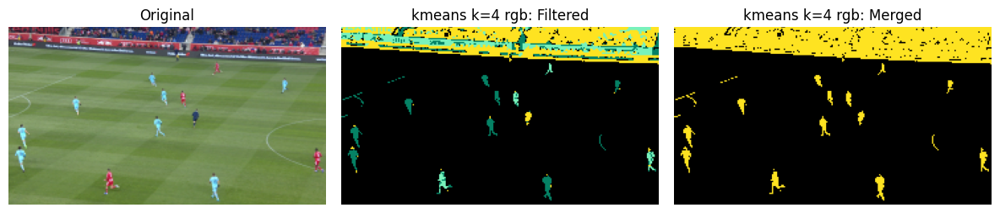

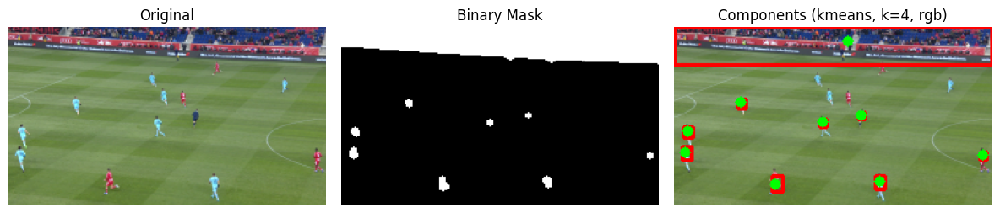

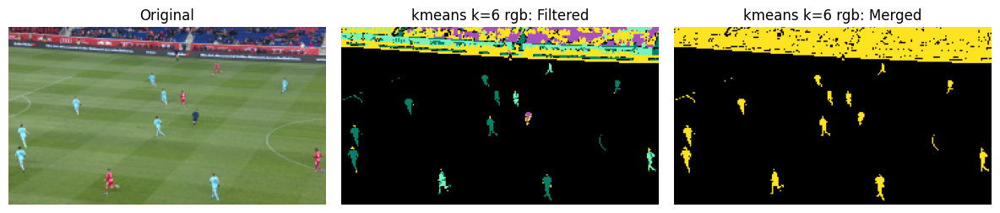

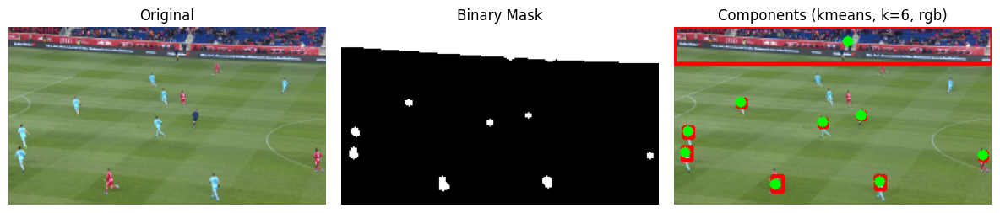

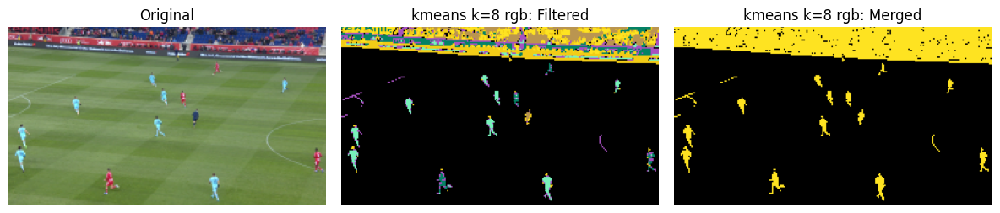

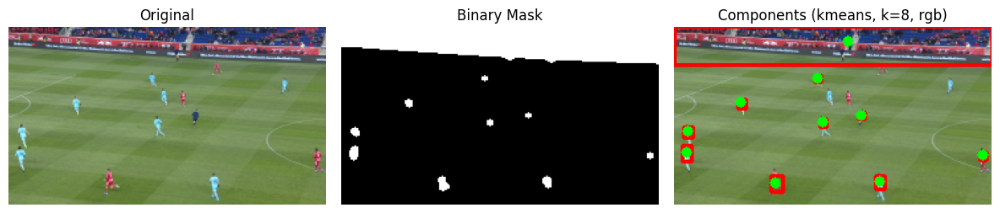

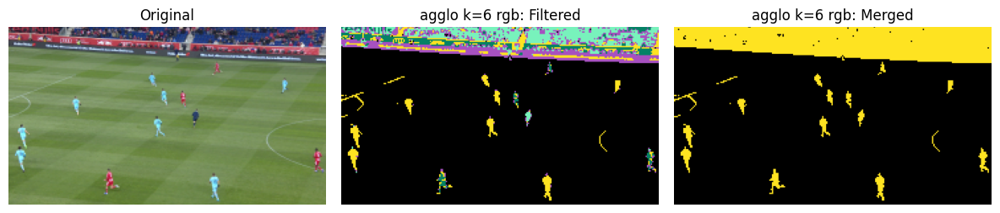

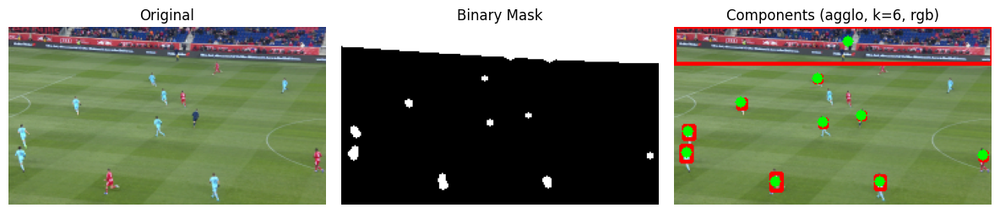

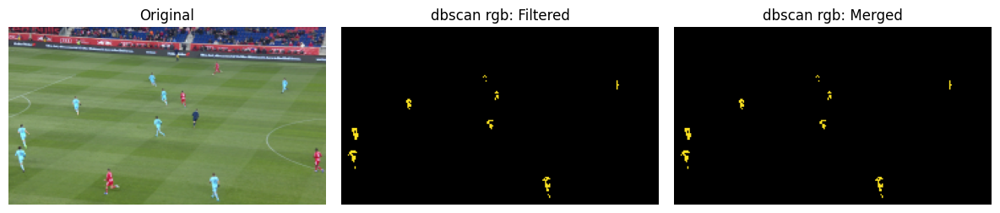

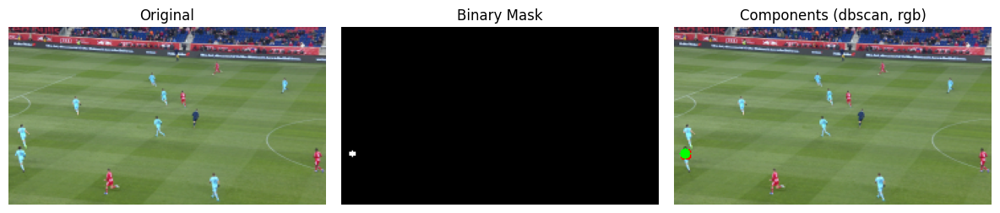

 Feature rgb_xy -> 5 dims


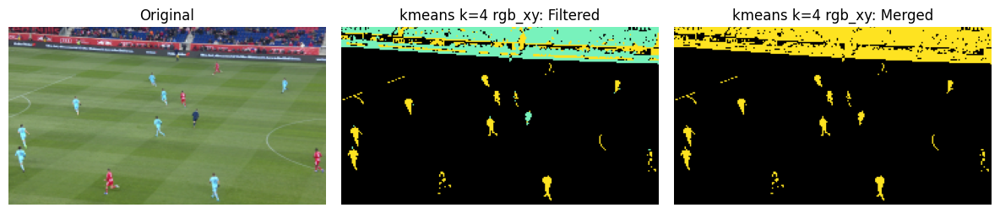

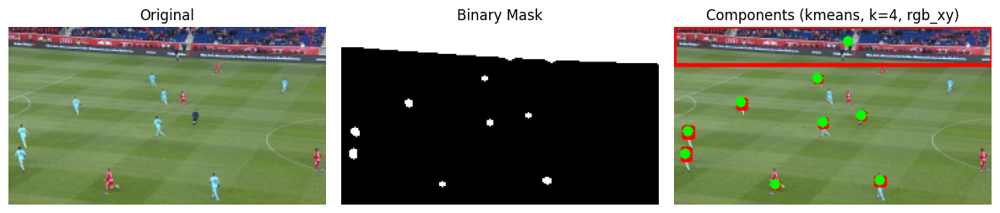

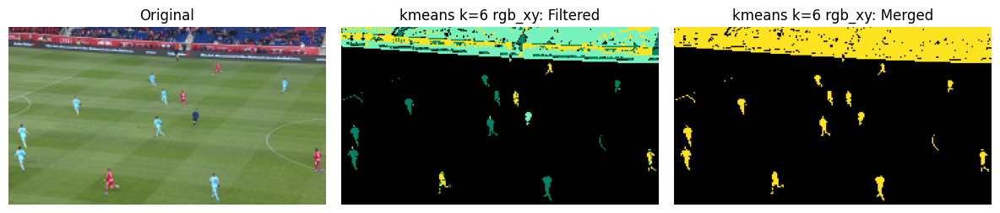

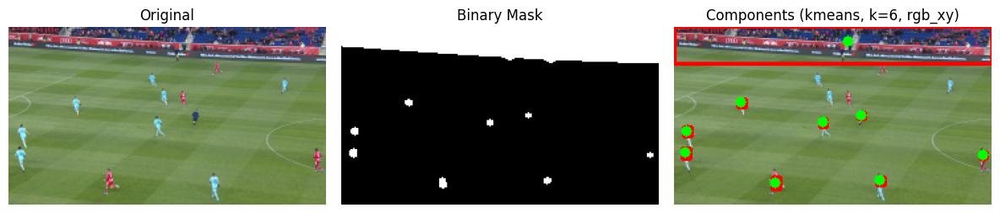

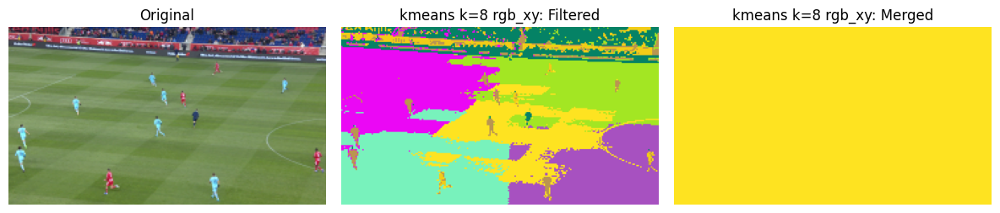

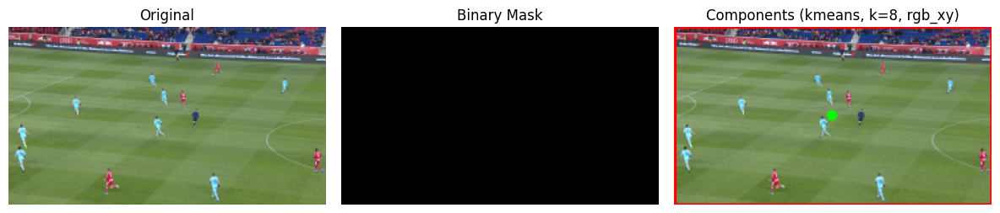

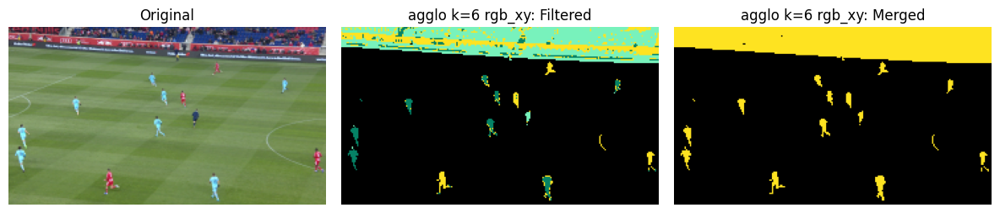

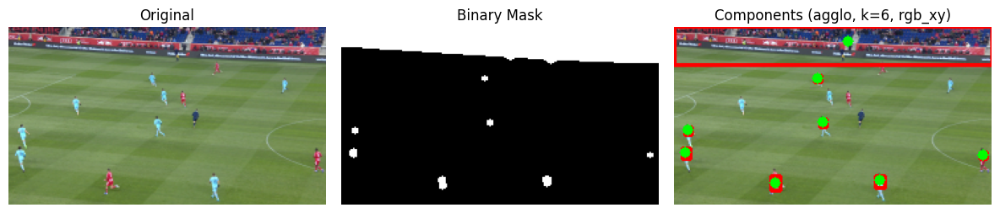

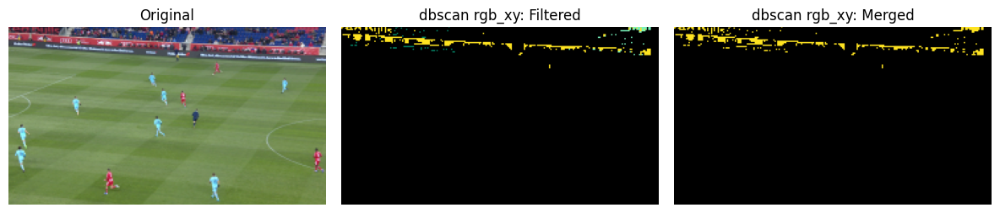

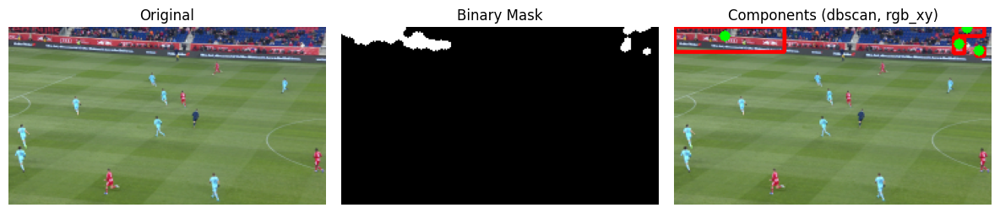

 Feature rgb_lab_xy_texture -> 13 dims


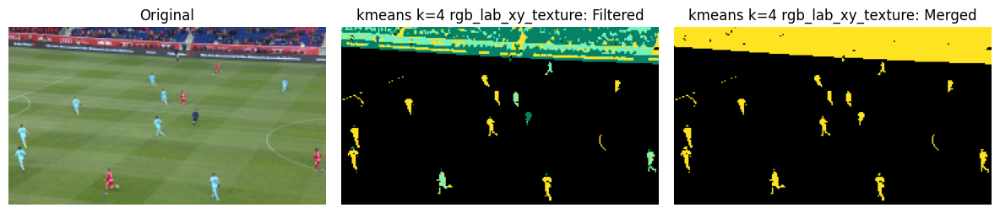

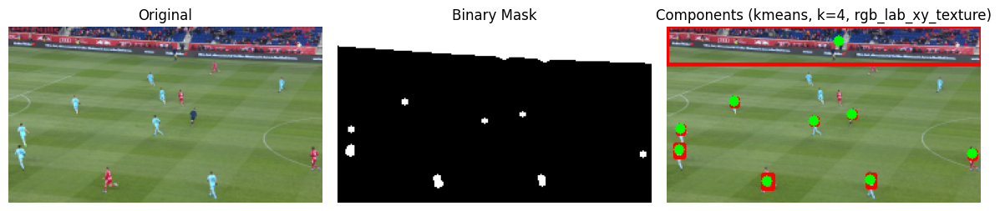

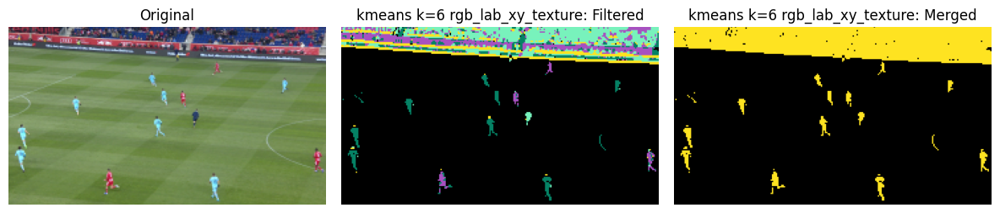

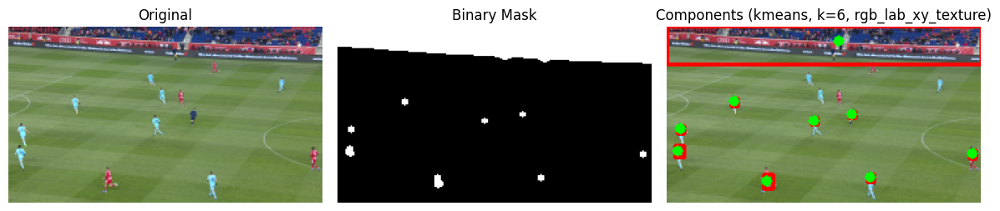

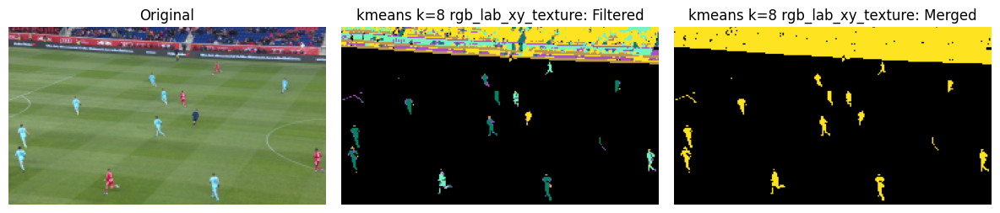

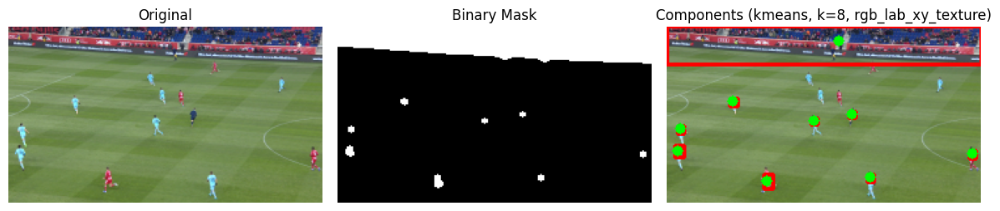

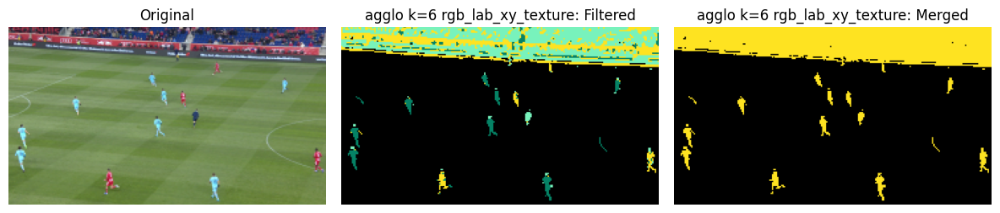

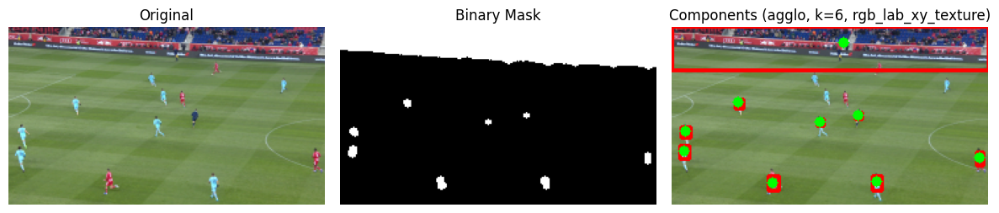

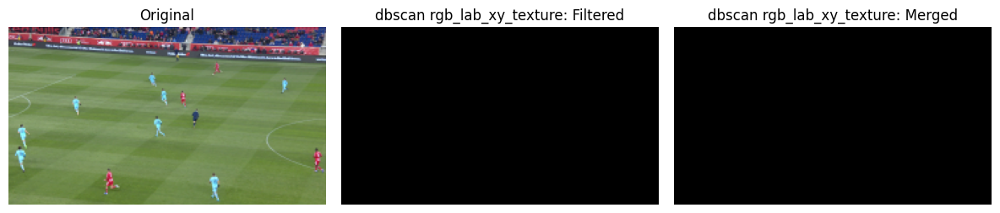

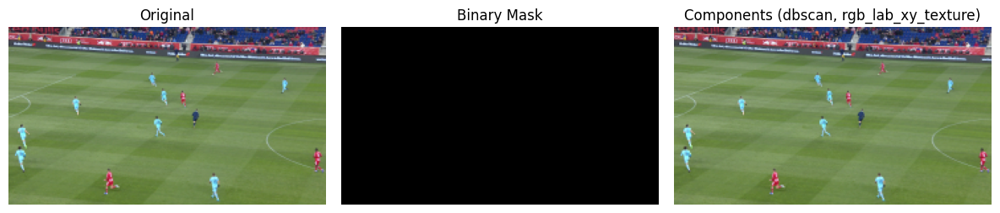

,image,label,area,bbox_x,bbox_y,bbox_w,bbox_h,centroid_x,centroid_y,feature,method,k,n_clusters_after_step4
0,10.png,1.0,5508.0,0.0,0.0,240.0,29.0,131.157771,11.311002,rgb,kmeans,4.0,1.0
1,10.png,2.0,31.0,48.0,55.0,6.0,7.0,50.677419,57.806452,rgb,kmeans,4.0,1.0
2,10.png,3.0,17.0,139.0,65.0,5.0,5.0,141.000000,67.000000,rgb,kmeans,4.0,1.0
3,10.png,4.0,22.0,110.0,70.0,5.0,6.0,112.000000,72.500000,rgb,kmeans,4.0,1.0
4,10.png,5.0,38.0,7.0,76.0,7.0,8.0,10.157895,79.500000,rgb,kmeans,4.0,1.0
5,10.png,6.0,50.0,6.0,91.0,7.0,10.0,8.880000,95.640000,rgb,kmeans,4.0,1.0
6,10.png,7.0,22.0,231.0,95.0,5.0,6.0,233.000000,97.500000,rgb,kmeans,4.0,1.0
7,10.png,8.0,66.0,74.0,113.0,8.0,12.0,76.757576,119.000000,rgb,kmeans,4.0,1.0
8,10.png,9.0,49.0,152.0,113.0,7.0,10.0,155.387755,117.326531,rgb,kmeans,4.0,1.0
9,10.png,1.0,5500.0,0.0,0.0,240.0,28.0,131.121273,11.290727,rgb,kmeans,6.0,1.0


In [21]:
df_part5 = run_experiment_part5(
    n_images=1,
    visualize=True,
    min_area_frac_step4=0.0005,
    max_area_frac_step4=0.20,
    green_filter_step4=True, green_ratio_step4=1.25,
    merge_distance_px=4,
    morph_close_radius=3,
    morph_open_radius=2,
    min_component_area_frac=0.0005
)
display(df_part5.head(20))


## Part 6